In [1]:
import os
import importlib
import sys
sys.path.append(r'../FRAPPE')
import DB
importlib.reload(DB)
from DB import DB

import Func
importlib.reload(Func)
from Func import icafeswc

In [7]:
#export images with contours
import CASCADE
importlib.reload(CASCADE)
from CASCADE import CASCADE
import glob
TP = '24'
pi = '9911265'
sidei = 'L'
eidir = r'W:/'+TP+'tp29\cascade/'+TP+'/'+pi+'/*'+sidei # In \\128.208.221.24\OAI-Derived-Data-and-Results
glb = glob.glob(eidir)
if len(glb)==0:
    print('No ei')
    assert 1==2

ei = os.path.basename(glb[0])
print(TP,pi,ei)

casname = 'E'+ei+'_'+sidei
cascadepath = r'W:/'+TP+'tp29\cascade/'+TP+'/'+pi+'/'+ei
cas = CASCADE(casname,cascadepath,cascadepath,0)

24 9911265 20070501L
Loading QVJ W:/24tp29\cascade/24/9911265/20070501L\E20070501L_L.QVJ
Adding QVS E20070501LS101_L.QVS


C:\Users\yin\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


no such contour Lumen
No lumen contour for frappe dcm slice 83


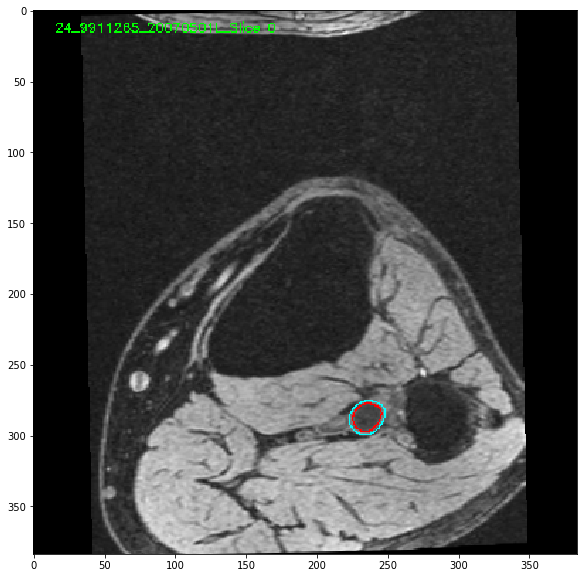

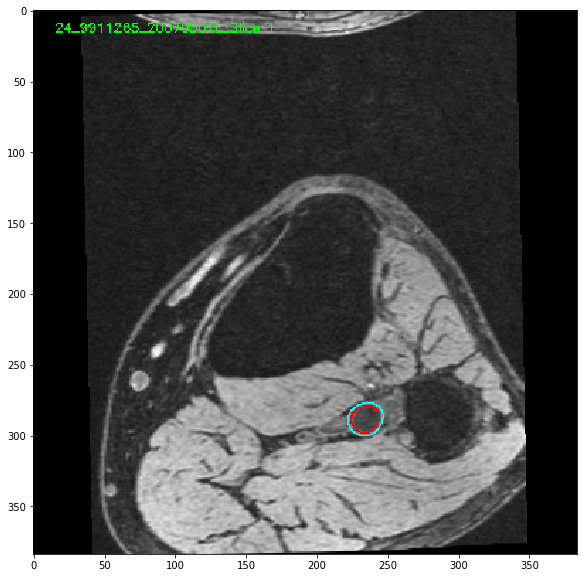

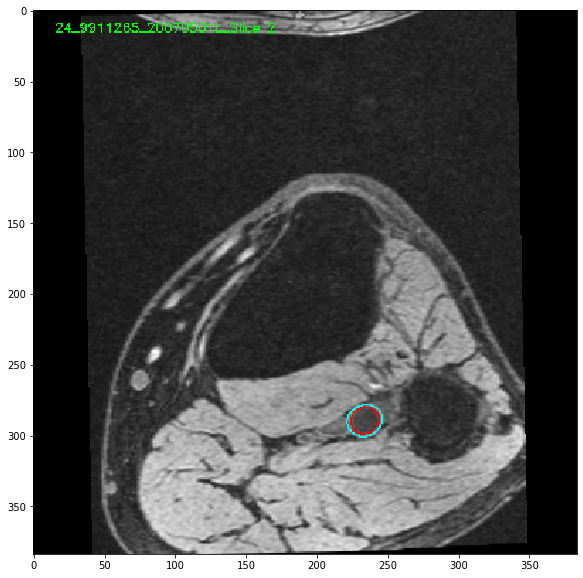

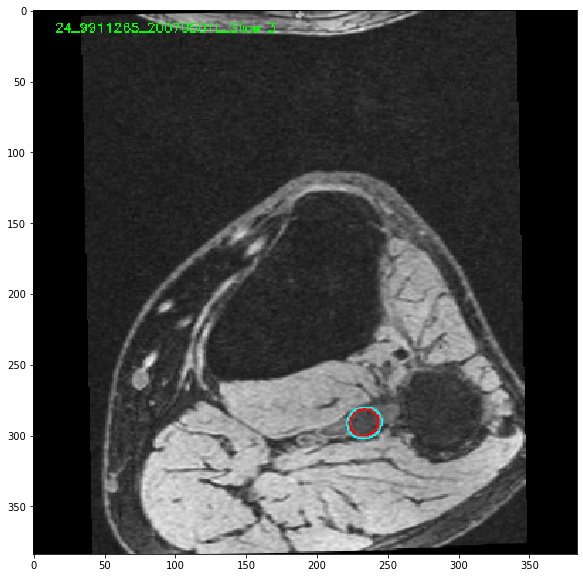

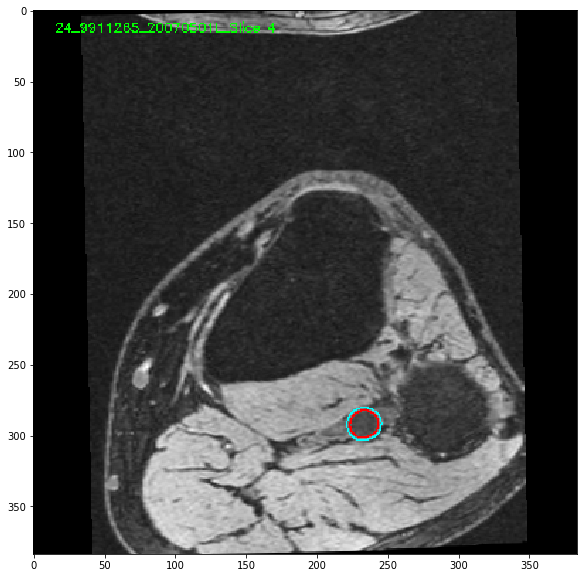

...

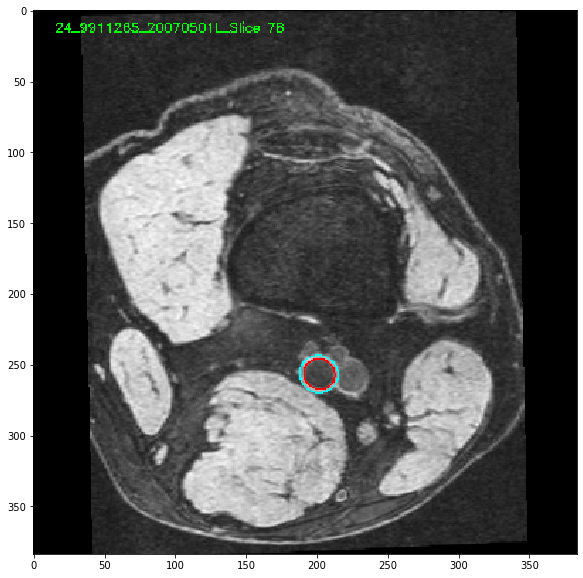

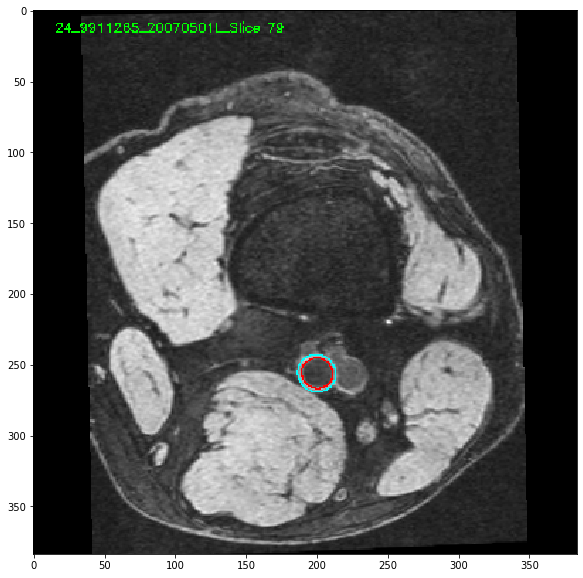

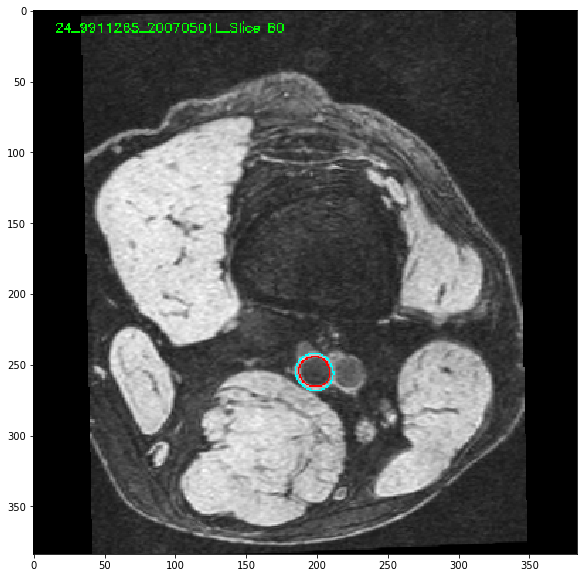

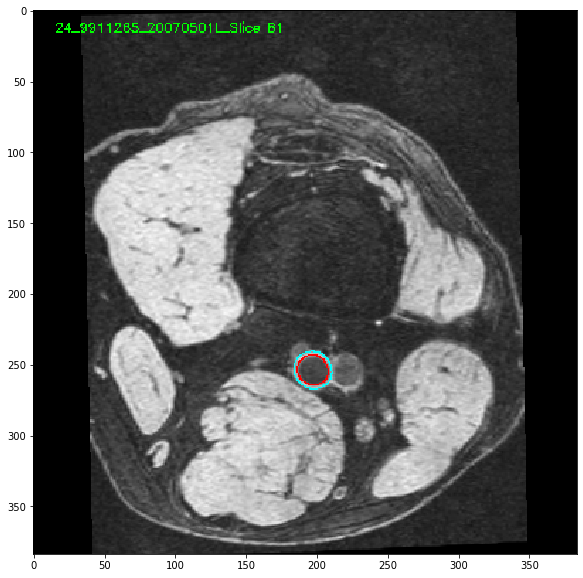

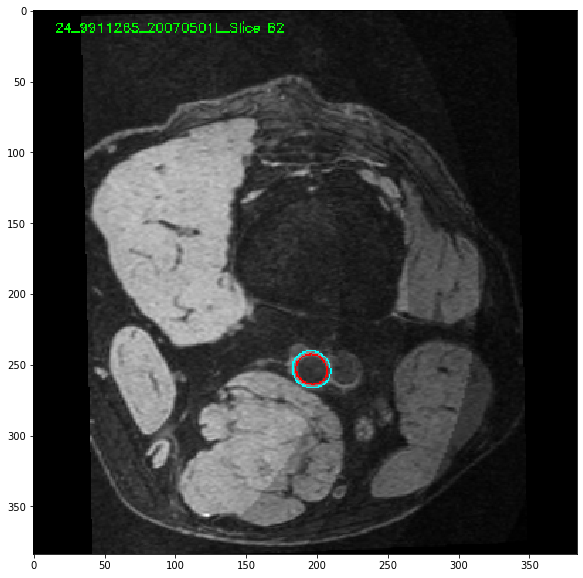

In [15]:
import pydicom
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

dcmlist = cas.listdicomfiles()

for slicei in range(len(dcmlist)):
    dcm = pydicom.read_file(cascadepath+'/'+dcmlist[slicei]+'.dcm').pixel_array
    dcm = dcm/np.max(dcm)*255
    dcm = dcm.astype(np.uint8)
    dcmcom = np.repeat(dcm[:,:,None],3,axis=2)
    cv2.putText(dcmcom,TP+'_'+pi+'_'+ei+'_Slice %d'%slicei,(15,15), 
                    cv2.FONT_HERSHEY_SIMPLEX, 
                    0.3, 
                    (0,255,0), 1)
    dcmcomo = dcmcom.copy()
    
    cont = cas.getcontour('Lumen',slicei+1)
    if cont is None or np.size(cont[0])<2:
        print('No lumen contour for frappe dcm slice',slicei)
        continue
    contt = []
    for conti in cont:
        contt.append([conti])
    contt = [np.array(contt).astype(np.int32)]

    dcmcom = cv2.drawContours(dcmcom, contt, 0, (255,0,0), 1)

    cont = cas.getcontour('OuterWall',slicei+1)
    if cont is None or  np.size(cont[0])<2:
        print('No lumen contour for frappe dcm slice',slicei)
        continue
    contt = []
    for conti in cont:
        contt.append([conti])
    contt = [np.array(contt).astype(np.int32)]

    dcmcom = cv2.drawContours(dcmcom, contt, 0, (0,255,255), 1)
    
    plt.figure(figsize=(10,10))
    plt.imshow(dcmcom)